# Pulmonary Localization Using Convolutional Neural Networks - ResNet Architecture
***

### 1. Importing and Installing Packages
***

In [ ]:
!pip install lungs-segmentation

In [1]:
from lungs_segmentation.pre_trained_models import create_model
from sklearn.model_selection import train_test_split
import lungs_segmentation.inference as inference
from bbox_delimiters import bbox_utils
import matplotlib.pyplot as plt
from google.colab import drive
import urllib.request as url
import tensorflow as tf
import pandas as pd
import numpy as np
import shutil
import random
import glob
import time
import cv2
import torch

In [2]:
seg_model = bbox_utils().model_segmentation(architecture = 'resnet34')

### 2. Importing CheXpert Data
***

In [ ]:
 drive.mount('/content/gdrive', force_remount = True)
!cp -r /content/gdrive/MyDrive/chexpert-v10-small.zip /content/
!unzip /content/chexpert-v10-small.zip
!rm /content/chexpert-v10-small.zip

### 3. Creating Training, Validation, and Testing Dataframes
***

In [6]:
train_data = pd.read_csv('/content/train-data.csv', delimiter = ',',
                         usecols = ['Path', 'p1_x', 'p1_y', 'p2_x', 'p2_y'])
test_data = pd.read_csv('/content/test-data.csv', delimiter = ',',
                        usecols = ['Path', 'p1_x', 'p1_y', 'p2_x', 'p2_y'])
val_data = pd.read_csv('/content/val-data.csv', delimiter = ',',
                       usecols = ['Path', 'p1_x', 'p1_y', 'p2_x', 'p2_y'])

print('Training Images: {} images'.format(len(train_data)))
print('Validation Images: {} images'.format(len(val_data)))
print('Test Images: {} images'.format(len(test_data)))

Training Images: 152808 images
Validation Images: 19051 images
Test Images: 19101 images


### 4. Preparing Data for the Network
***

In [7]:
def make_gen(dataframe):
  '''
  build an image generator from a dataframe

  Args:
    dataframe (dataframe) --> pandas pack data set

  Returns:
    gen (generator) --> keras data generator
  '''

  data_gen = tf.keras.preprocessing.image.ImageDataGenerator(rescale = 1./255.)
  gen = data_gen.flow_from_dataframe(dataframe = dataframe, directory = '', x_col = 'Path',
                                     y_col = ['p1_x', 'p1_y', 'p2_x', 'p2_y'], 
                                     target_size = (128, 128), color_mode ='rgb', batch_size = 128,
                                     class_mode='raw', shuffle = True, seed = 42)
  
  return gen

In [8]:
train_generator = make_gen(dataframe = train_data)
validation_generator = make_gen(dataframe = val_data)
test_generator = make_gen(dataframe = test_data)

Found 152808 validated image filenames.
Found 19051 validated image filenames.
Found 19101 validated image filenames.


### 5. Organizing the Network Architecture
***

In [ ]:
conv_base = tf.keras.applications.ResNet50V2(input_shape = (128, 128, 3), include_top = False, weights = 'imagenet')

In [22]:
layers_name = list()
for layer in conv_base.layers:
  layers_name.append(layer.name)

block_names = ['input_3', 'conv2_block3_3_conv', 'conv3_block4_1_conv', 'conv4_block3_2_pad', 'conv4_block6_3_conv']

for blocks in block_names:
  try:
    layers_name.index(blocks)
    print('Bloco ' + blocks + ' found!')
  except ValueError:
    print('Bloco ' + blocks + ' not found!')

Bloco input_3 found!
Bloco conv2_block3_3_conv found!
Bloco conv3_block4_1_conv found!
Bloco conv4_block3_2_pad found!
Bloco conv4_block6_3_conv found!


In [23]:
inputs = tf.keras.Input(shape=(128, 128, 3))
feature_extractor = conv_base(inputs)

x = tf.keras.layers.GlobalAveragePooling2D()(feature_extractor)
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(units = 512, activation = tf.nn.relu)(x)
x = tf.keras.layers.Dense(units = 256, activation = tf.nn.relu)(x)
x = tf.keras.layers.Dense(units = 64, activation = tf.nn.relu)(x)

bounding_box_regression_output = tf.keras.layers.Dense(units = 4)(x)
model = tf.keras.models.Model(inputs = inputs, outputs = bounding_box_regression_output)

model.compile(optimizer=tf.keras.optimizers.SGD(momentum = 0.9), loss = 'mean_squared_error', metrics = ['acc'])

In [24]:
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
resnet50v2 (Functional)      (None, 4, 4, 2048)        23564800  
_________________________________________________________________
global_average_pooling2d (Gl (None, 2048)              0         
_________________________________________________________________
flatten (Flatten)            (None, 2048)              0         
_________________________________________________________________
dense (Dense)                (None, 512)               1049088   
_________________________________________________________________
dense_1 (Dense)              (None, 256)               131328    
_________________________________________________________________
dense_2 (Dense)              (None, 64)                16448 

In [25]:
def freeze_layers(conv_base, layer_name):
  '''
  freeze layers of convolutional neural network training

  Args:
    conv_base (tensor) --> convolutional layers of the model
    layer_name (str) --> name of the freezing weight boundary layer
  '''

  conv_base.trainable = True
  set_trainable = False

  for layer in conv_base.layers:
    if layer.name == layer_name:
      set_trainable = True
    if set_trainable:
      layer.trainable = True
    else:
      layer.trainable = False
  
  return None

### 5. Organizing the Assessment Metric (IoU)
***

In [26]:
def intersection_over_union(pred_box, true_box, smoothing_factor = 1e-10):
  '''
  intersection metric on the Union of bounding boxes

  Args:
    pred_box (list) --> coordinates of predicted bounding boxes
    true_box (list) --> coordinates of the original bounding boxes

  Returns:
    iou (int) --> calculated IoU metric
  '''

  xmin_pred, ymin_pred, xmax_pred, ymax_pred =  pred_box
  xmin_true, ymin_true, xmax_true, ymax_true = true_box

  xmin_overlap = np.maximum(xmin_pred, xmin_true)
  xmax_overlap = np.minimum(xmax_pred, xmax_true)
  ymin_overlap = np.maximum(ymin_pred, ymin_true)
  ymax_overlap = np.minimum(ymax_pred, ymax_true)

  pred_box_area = (xmax_pred - xmin_pred) * (ymax_pred - ymin_pred)
  true_box_area = (xmax_true - xmin_true) * (ymax_true - ymin_true)

  overlap_area = np.maximum((xmax_overlap - xmin_overlap), 0)  * np.maximum((ymax_overlap - ymin_overlap), 0)
  union_area = (pred_box_area + true_box_area) - overlap_area
    
  iou = (overlap_area + smoothing_factor) / (union_area + smoothing_factor)

  return iou

### 6. Getting Test Data
***

In [27]:
for i in range(0, len(test_generator)):
  x, y = test_generator[i]
  if i == 0:
    test_images, test_labels = x, y
  else:
    test_images, test_labels = np.concatenate((test_images, x)), np.concatenate((test_labels, y))

### 7. Model Training
***

In [28]:
checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath = 'weights.hdf5', monitor = 'val_acc', verbose = True, 
                                                save_best_only = True, save_weights_only = True, mode = 'max')
callbacks = [checkpoint]

In [29]:
 freeze_layers(conv_base = conv_base, layer_name = block_names[4])
 model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
resnet50v2 (Functional)      (None, 4, 4, 2048)        23564800  
_________________________________________________________________
global_average_pooling2d (Gl (None, 2048)              0         
_________________________________________________________________
flatten (Flatten)            (None, 2048)              0         
_________________________________________________________________
dense (Dense)                (None, 512)               1049088   
_________________________________________________________________
dense_1 (Dense)              (None, 256)               131328    
_________________________________________________________________
dense_2 (Dense)              (None, 64)                16448 

In [30]:
history = model.fit(train_generator, validation_data = validation_generator, 
                    epochs = 4, verbose = True, use_multiprocessing = True,
                    workers = 8, callbacks = callbacks)

Epoch 1/4
1194/1194 [==============================] - 324s 250ms/step - loss: 0.0054 - acc: 0.7702 - val_loss: 0.0021 - val_acc: 0.8163

Epoch 00001: val_acc improved from -inf to 0.81634, saving model to weights.hdf5
Epoch 2/4
1194/1194 [==============================] - 294s 244ms/step - loss: 0.0018 - acc: 0.8360 - val_loss: 0.0017 - val_acc: 0.8350

Epoch 00002: val_acc improved from 0.81634 to 0.83502, saving model to weights.hdf5
Epoch 3/4
1194/1194 [==============================] - 292s 243ms/step - loss: 0.0015 - acc: 0.8506 - val_loss: 0.0015 - val_acc: 0.8427

Epoch 00003: val_acc improved from 0.83502 to 0.84274, saving model to weights.hdf5
Epoch 4/4
1194/1194 [==============================] - 290s 241ms/step - loss: 0.0014 - acc: 0.8591 - val_loss: 0.0014 - val_acc: 0.8528

Epoch 00004: val_acc improved from 0.84274 to 0.85276, saving model to weights.hdf5


In [ ]:
model.save('model_resnet1')
!zip -r model_resnet1.zip /content/model_resnet1
shutil.move('/content/model_resnet1.zip', '/content/gdrive/MyDrive/lung-localization/resnet/')

In [32]:
iou_mean_list = list()
iou_scores_list = list()
pred_boxes = model.predict(test_images)

scores = list()
for j in range(0, len(pred_boxes)):
  scores.append(intersection_over_union(pred_boxes[j], test_labels[j]))
    
iou_mean_list.append(np.array(scores).mean())
iou_scores_list.append(scores)

print('IoU Metric: {:.2f}%'.format(iou_mean_list[0] * 100))

IoU Metric: 87.31%


In [ ]:
scores = np.array(scores)
np.savetxt('scores_model1_resnet.txt', scores)
shutil.move('/content/scores_model1_resnet.txt', '/content/gdrive/MyDrive/lung-localization/resnet/')

In [34]:
 freeze_layers(conv_base = conv_base, layer_name = block_names[3])
 model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
resnet50v2 (Functional)      (None, 4, 4, 2048)        23564800  
_________________________________________________________________
global_average_pooling2d (Gl (None, 2048)              0         
_________________________________________________________________
flatten (Flatten)            (None, 2048)              0         
_________________________________________________________________
dense (Dense)                (None, 512)               1049088   
_________________________________________________________________
dense_1 (Dense)              (None, 256)               131328    
_________________________________________________________________
dense_2 (Dense)              (None, 64)                16448 

In [35]:
history = model.fit(train_generator, validation_data = validation_generator, 
                    epochs = 4, verbose = True, use_multiprocessing = True,
                    workers = 8, callbacks = callbacks)

Epoch 1/4
1194/1194 [==============================] - 313s 260ms/step - loss: 0.0013 - acc: 0.8656 - val_loss: 0.0013 - val_acc: 0.8574

Epoch 00001: val_acc improved from 0.85276 to 0.85744, saving model to weights.hdf5
Epoch 2/4
1194/1194 [==============================] - 311s 257ms/step - loss: 0.0012 - acc: 0.8703 - val_loss: 0.0013 - val_acc: 0.8622

Epoch 00002: val_acc improved from 0.85744 to 0.86221, saving model to weights.hdf5
Epoch 3/4
1194/1194 [==============================] - 312s 259ms/step - loss: 0.0012 - acc: 0.8735 - val_loss: 0.0012 - val_acc: 0.8655

Epoch 00003: val_acc improved from 0.86221 to 0.86547, saving model to weights.hdf5
Epoch 4/4
1194/1194 [==============================] - 311s 258ms/step - loss: 0.0011 - acc: 0.8779 - val_loss: 0.0012 - val_acc: 0.8652

Epoch 00004: val_acc did not improve from 0.86547


In [ ]:
model.save('model_resnet2')
!zip -r model_resnet2.zip /content/model_resnet2
shutil.move('/content/model_resnet2.zip', '/content/gdrive/MyDrive/lung-localization/resnet/')

In [37]:
pred_boxes = model.predict(test_images)

scores = list()
for j in range(0, len(pred_boxes)):
  scores.append(intersection_over_union(pred_boxes[j], test_labels[j]))
    
iou_mean_list.append(np.array(scores).mean())
iou_scores_list.append(scores)

print('Métrica IoU: {:.2f}%'.format(iou_mean_list[1] * 100))

Métrica IoU: 88.68%


In [ ]:
scores = np.array(scores)
np.savetxt('scores_model2_resnet.txt', scores)
shutil.move('/content/scores_model2_resnet.txt', '/content/gdrive/MyDrive/lung-localization/resnet/')

In [39]:
freeze_layers(conv_base = conv_base, layer_name = block_names[2])
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
resnet50v2 (Functional)      (None, 4, 4, 2048)        23564800  
_________________________________________________________________
global_average_pooling2d (Gl (None, 2048)              0         
_________________________________________________________________
flatten (Flatten)            (None, 2048)              0         
_________________________________________________________________
dense (Dense)                (None, 512)               1049088   
_________________________________________________________________
dense_1 (Dense)              (None, 256)               131328    
_________________________________________________________________
dense_2 (Dense)              (None, 64)                16448 

In [40]:
  history = model.fit(train_generator, validation_data = validation_generator, 
                    epochs = 4, verbose = True, use_multiprocessing = True,
                    workers = 8, callbacks = callbacks)

Epoch 1/4
1194/1194 [==============================] - 306s 253ms/step - loss: 0.0011 - acc: 0.8805 - val_loss: 0.0012 - val_acc: 0.8727

Epoch 00001: val_acc improved from 0.86547 to 0.87266, saving model to weights.hdf5
Epoch 2/4
1194/1194 [==============================] - 315s 261ms/step - loss: 0.0011 - acc: 0.8835 - val_loss: 0.0011 - val_acc: 0.8735

Epoch 00002: val_acc improved from 0.87266 to 0.87350, saving model to weights.hdf5
Epoch 3/4
1194/1194 [==============================] - 316s 261ms/step - loss: 0.0010 - acc: 0.8852 - val_loss: 0.0011 - val_acc: 0.8762

Epoch 00003: val_acc improved from 0.87350 to 0.87623, saving model to weights.hdf5
Epoch 4/4
1194/1194 [==============================] - 308s 254ms/step - loss: 9.9806e-04 - acc: 0.8874 - val_loss: 0.0011 - val_acc: 0.8793

Epoch 00004: val_acc improved from 0.87623 to 0.87927, saving model to weights.hdf5


In [ ]:
model.save('model_resnet3')
!zip -r model_resnet3.zip /content/model_resnet3
shutil.move('/content/model_resnet3.zip', '/content/gdrive/MyDrive/lung-localization/resnet/')

In [42]:
pred_boxes = model.predict(test_images)

scores = list()
for j in range(0, len(pred_boxes)):
  scores.append(intersection_over_union(pred_boxes[j], test_labels[j]))
    
iou_mean_list.append(np.array(scores).mean())
iou_scores_list.append(scores)

print('Métrica IoU: {:.2f}%'.format(iou_mean_list[2] * 100))

Métrica IoU: 89.38%


In [ ]:
scores = np.array(scores)
np.savetxt('scores_model3_resnet.txt', scores) 
shutil.move('/content/scores_model3_resnet.txt', '/content/gdrive/MyDrive/lung-localization/resnet/')

In [44]:
freeze_layers(conv_base = conv_base, layer_name = block_names[1])
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
resnet50v2 (Functional)      (None, 4, 4, 2048)        23564800  
_________________________________________________________________
global_average_pooling2d (Gl (None, 2048)              0         
_________________________________________________________________
flatten (Flatten)            (None, 2048)              0         
_________________________________________________________________
dense (Dense)                (None, 512)               1049088   
_________________________________________________________________
dense_1 (Dense)              (None, 256)               131328    
_________________________________________________________________
dense_2 (Dense)              (None, 64)                16448 

In [45]:
history = model.fit(train_generator, validation_data = validation_generator, 
                    epochs = 4, verbose = True, use_multiprocessing = True,
                    workers = 8, callbacks = callbacks)

Epoch 1/4
1194/1194 [==============================] - 317s 262ms/step - loss: 9.7661e-04 - acc: 0.8892 - val_loss: 0.0011 - val_acc: 0.8802

Epoch 00001: val_acc improved from 0.87927 to 0.88016, saving model to weights.hdf5
Epoch 2/4
1194/1194 [==============================] - 310s 256ms/step - loss: 9.5467e-04 - acc: 0.8908 - val_loss: 0.0011 - val_acc: 0.8821

Epoch 00002: val_acc improved from 0.88016 to 0.88211, saving model to weights.hdf5
Epoch 3/4
1194/1194 [==============================] - 314s 260ms/step - loss: 9.3627e-04 - acc: 0.8917 - val_loss: 0.0011 - val_acc: 0.8829

Epoch 00003: val_acc improved from 0.88211 to 0.88289, saving model to weights.hdf5
Epoch 4/4
1194/1194 [==============================] - 312s 258ms/step - loss: 9.1680e-04 - acc: 0.8938 - val_loss: 0.0010 - val_acc: 0.8845

Epoch 00004: val_acc improved from 0.88289 to 0.88447, saving model to weights.hdf5


In [ ]:
model.save('model_resnet4')
!zip -r model_resnet4.zip /content/model_resnet4
shutil.move('/content/model_resnet4.zip', '/content/gdrive/MyDrive/lung-localization/resnet/')

In [47]:
pred_boxes = model.predict(test_images)

scores = list()
for j in range(0, len(pred_boxes)):
  scores.append(intersection_over_union(pred_boxes[j], test_labels[j]))
    
iou_mean_list.append(np.array(scores).mean())
iou_scores_list.append(scores)

print('Métrica IoU: {:.2f}%'.format(iou_mean_list[3] * 100))

Métrica IoU: 89.75%


In [ ]:
scores = np.array(scores)
np.savetxt('scores_model4_resnet.txt', scores)
shutil.move('/content/scores_model4_resnet.txt', '/content/gdrive/MyDrive/lung-localization/resnet/')

In [49]:
freeze_layers(conv_base = conv_base, layer_name = block_names[0])
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
resnet50v2 (Functional)      (None, 4, 4, 2048)        23564800  
_________________________________________________________________
global_average_pooling2d (Gl (None, 2048)              0         
_________________________________________________________________
flatten (Flatten)            (None, 2048)              0         
_________________________________________________________________
dense (Dense)                (None, 512)               1049088   
_________________________________________________________________
dense_1 (Dense)              (None, 256)               131328    
_________________________________________________________________
dense_2 (Dense)              (None, 64)                16448 

In [50]:
history = model.fit(train_generator, validation_data = validation_generator, 
                    epochs = 4, verbose = True, use_multiprocessing = True,
                    workers = 8, callbacks = callbacks)

Epoch 1/4
1194/1194 [==============================] - 313s 259ms/step - loss: 9.0101e-04 - acc: 0.8949 - val_loss: 0.0010 - val_acc: 0.8857

Epoch 00001: val_acc improved from 0.88447 to 0.88568, saving model to weights.hdf5
Epoch 2/4
1194/1194 [==============================] - 314s 260ms/step - loss: 8.8643e-04 - acc: 0.8960 - val_loss: 0.0010 - val_acc: 0.8846

Epoch 00002: val_acc did not improve from 0.88568
Epoch 3/4
1194/1194 [==============================] - 310s 256ms/step - loss: 8.6908e-04 - acc: 0.8981 - val_loss: 0.0010 - val_acc: 0.8849

Epoch 00003: val_acc did not improve from 0.88568
Epoch 4/4
1194/1194 [==============================] - 315s 261ms/step - loss: 8.5771e-04 - acc: 0.8984 - val_loss: 0.0010 - val_acc: 0.8878

Epoch 00004: val_acc improved from 0.88568 to 0.88783, saving model to weights.hdf5


In [ ]:
model.save('model_resnet5')
!zip -r model_resnet5.zip /content/model_resnet5
shutil.move('/content/model_resnet5.zip', '/content/gdrive/MyDrive/lung-localization/resnet/')

In [52]:
pred_boxes = model.predict(test_images)

scores = list()
for j in range(0, len(pred_boxes)):
  scores.append(intersection_over_union(pred_boxes[j], test_labels[j]))
    
iou_mean_list.append(np.array(scores).mean())
iou_scores_list.append(scores)

print('Métrica IoU: {:.2f}%'.format(iou_mean_list[4] * 100))

Métrica IoU: 89.93%


In [ ]:
scores = np.array(scores)
np.savetxt('scores_model5_resnet.txt', scores)
shutil.move('/content/scores_model5_resnet.txt', '/content/gdrive/MyDrive/lung-localization/resnet/')

In [ ]:
np.savetxt('iou_mean_resnet.txt', np.array(iou_mean_list), fmt = '%s')
shutil.move('/content/iou_mean_resnet.txt', '/content/gdrive/MyDrive/lung-localization/resnet/')

## 8. Results View
***

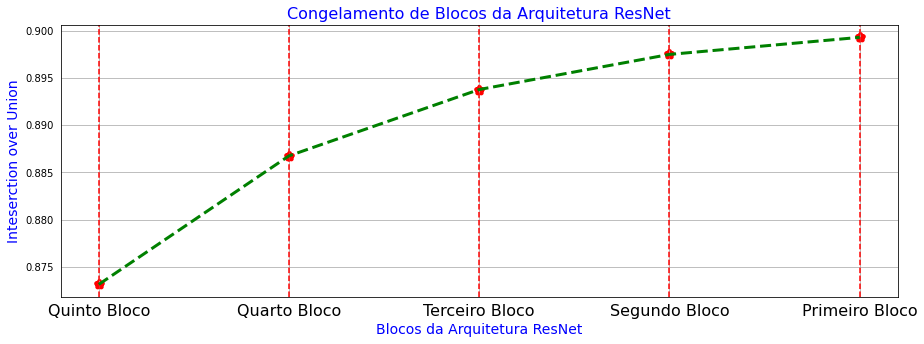

In [56]:
plt.figure(figsize = (15, 5))
x_labels = ['Quinto Bloco', 'Quarto Bloco', 'Terceiro Bloco', 'Segundo Bloco', 'Primeiro Bloco']
plt.scatter(x_labels, np.array(iou_mean_list), marker = '*', linewidths = 5, color = 'red')
for line in range(0, 5):
  plt.axvline(line, color = 'red', linestyle = '--')
plt.plot(x_labels, np.array(iou_mean_list), linestyle = '--', color = 'green', linewidth = 3)
plt.xticks(size = 16, color = 'black')
plt.yticks(color = 'black')
plt.title('Congelamento de Blocos da Arquitetura ResNet', size = 16, color = 'blue')
plt.xlabel('Blocos da Arquitetura ResNet', size = 14, color = 'blue')
plt.ylabel('Inteserction over Union', size = 14, color = 'blue')
plt.grid(True)

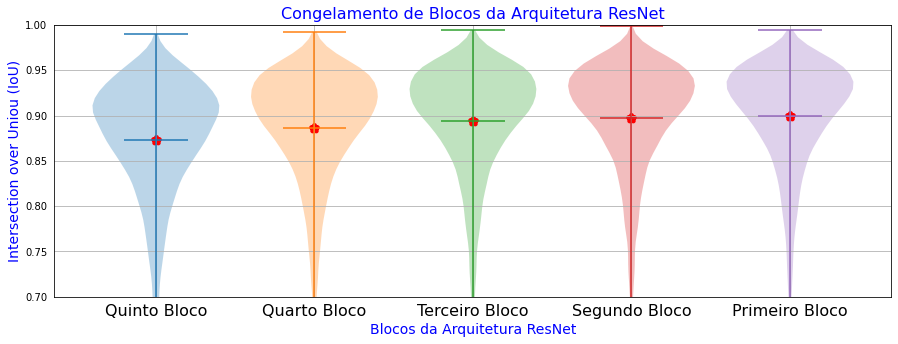

In [57]:
plt.figure(figsize = (15, 5))
plt.violinplot(iou_scores_list[0], positions = [1], showmeans = True, widths = 0.8)
plt.violinplot(iou_scores_list[1], positions = [2], showmeans = True, widths = 0.8)
plt.violinplot(iou_scores_list[2], positions = [3], showmeans = True, widths = 0.8)
plt.violinplot(iou_scores_list[3], positions = [4], showmeans = True, widths = 0.8)
plt.violinplot(iou_scores_list[4], positions = [5], showmeans = True, widths = 0.8)
plt.ylim([0.70, 1.0])
x_labels = ['Quinto Bloco', 'Quarto Bloco', 'Terceiro Bloco', 'Segundo Bloco', 'Primeiro Bloco']
plt.xticks(ticks = [1, 2, 3, 4, 5], labels = x_labels, size = 16, color = 'black')
plt.yticks(color = 'black')
plt.grid(True)
plt.xlabel('Blocos da Arquitetura ResNet', size = 14, color = 'blue')
plt.ylabel('Intersection over Uniou (IoU)', size = 14, color = 'blue')
plt.title('Congelamento de Blocos da Arquitetura ResNet', size = 16, color = 'blue')
plt.scatter([1, 2, 3, 4, 5], np.array(iou_mean_list), marker = '*', linewidths = 5, color = 'red')

Text(0.5, 1.0, 'Congelamento de Blocos da Arquitetura ResNet')

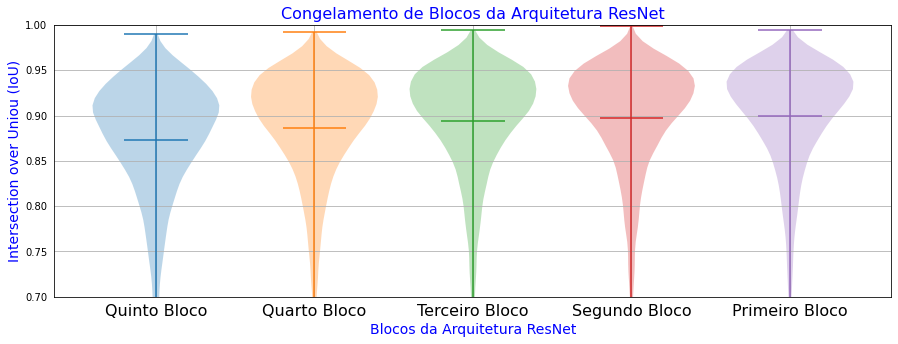

In [58]:
  plt.figure(figsize = (15, 5))
plt.violinplot(iou_scores_list[0], positions = [1], showmeans = True, widths = 0.8)
plt.violinplot(iou_scores_list[1], positions = [2], showmeans = True, widths = 0.8)
plt.violinplot(iou_scores_list[2], positions = [3], showmeans = True, widths = 0.8)
plt.violinplot(iou_scores_list[3], positions = [4], showmeans = True, widths = 0.8)
plt.violinplot(iou_scores_list[4], positions = [5], showmeans = True, widths = 0.8)
plt.ylim([0.70, 1.0])
x_labels = ['Quinto Bloco', 'Quarto Bloco', 'Terceiro Bloco', 'Segundo Bloco', 'Primeiro Bloco']
plt.xticks(ticks = [1, 2, 3, 4, 5], labels = x_labels, size = 16, color = 'black')
plt.yticks(color = 'black')
plt.grid(True)
plt.xlabel('Blocos da Arquitetura ResNet', size = 14, color = 'blue')
plt.ylabel('Intersection over Uniou (IoU)', size = 14, color = 'blue')
plt.title('Congelamento de Blocos da Arquitetura ResNet', size = 16, color = 'blue')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

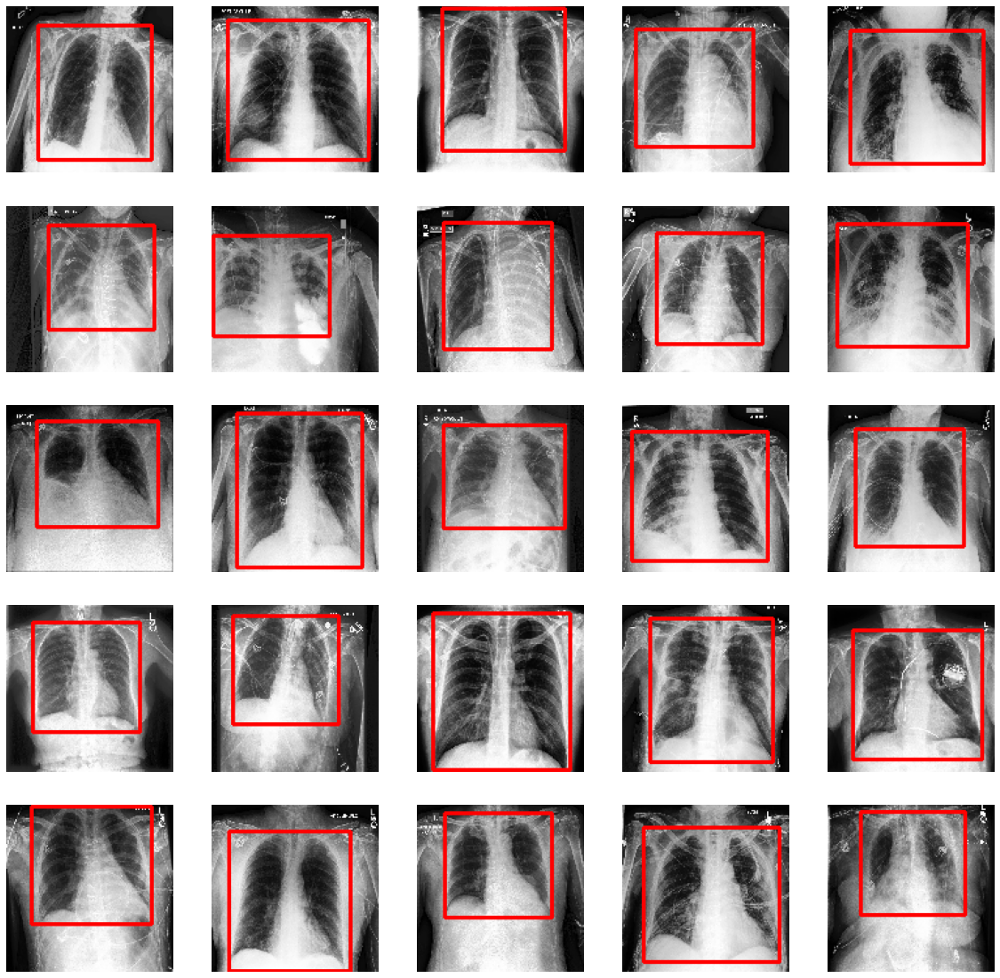

In [59]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
for i in range(0, 5):
  for j in range(0, 5):
    count = random.randrange(0, len(test_images))
    coordinates = model.predict(np.reshape(test_images[count], (1, 128, 128, 3)))[0]
    img = bbox_utils().draw_rectangle(image = test_images[count], list_coordinates = coordinates)
    axs[i, j].imshow(img)
    axs[i, j].axis('off')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

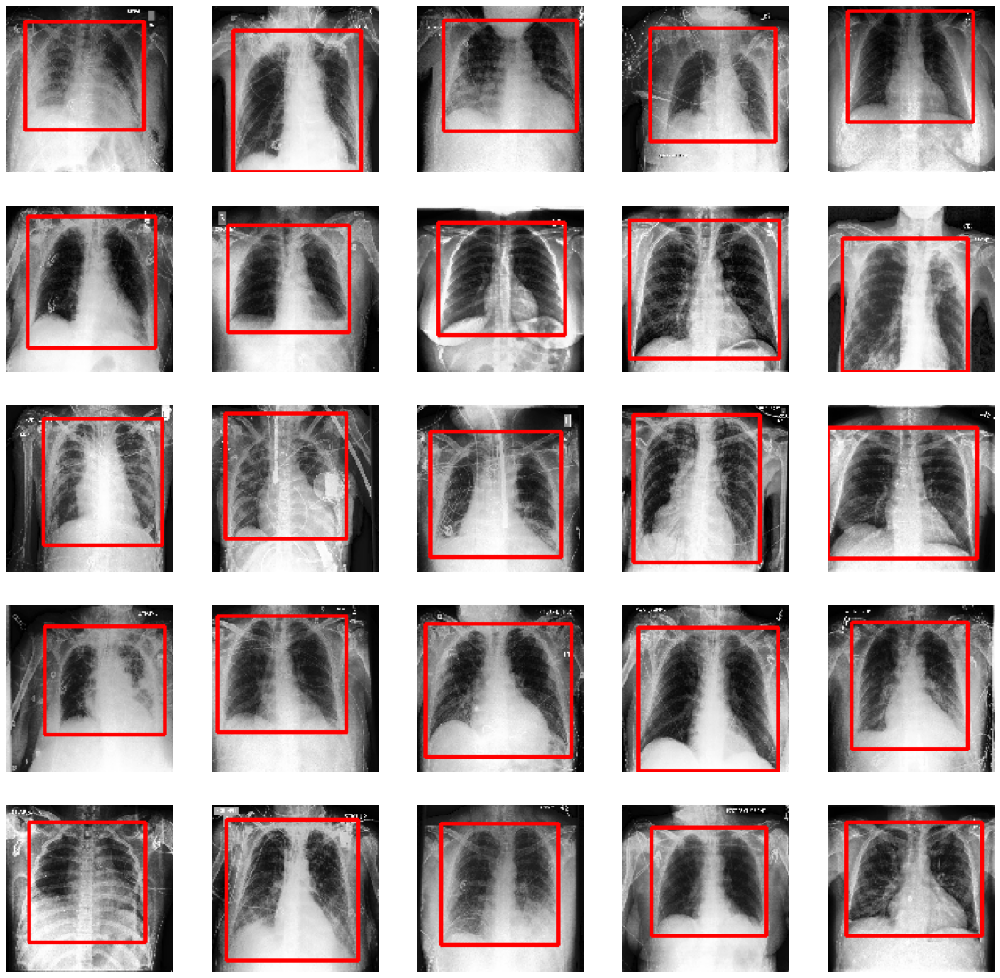

In [60]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
for i in range(0, 5):
  for j in range(0, 5):
    count = random.randrange(0, len(test_images))
    coordinates = model.predict(np.reshape(test_images[count], (1, 128, 128, 3)))[0]
    img = bbox_utils().draw_rectangle(image = test_images[count], list_coordinates = coordinates)
    axs[i, j].imshow(img)
    axs[i, j].axis('off')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

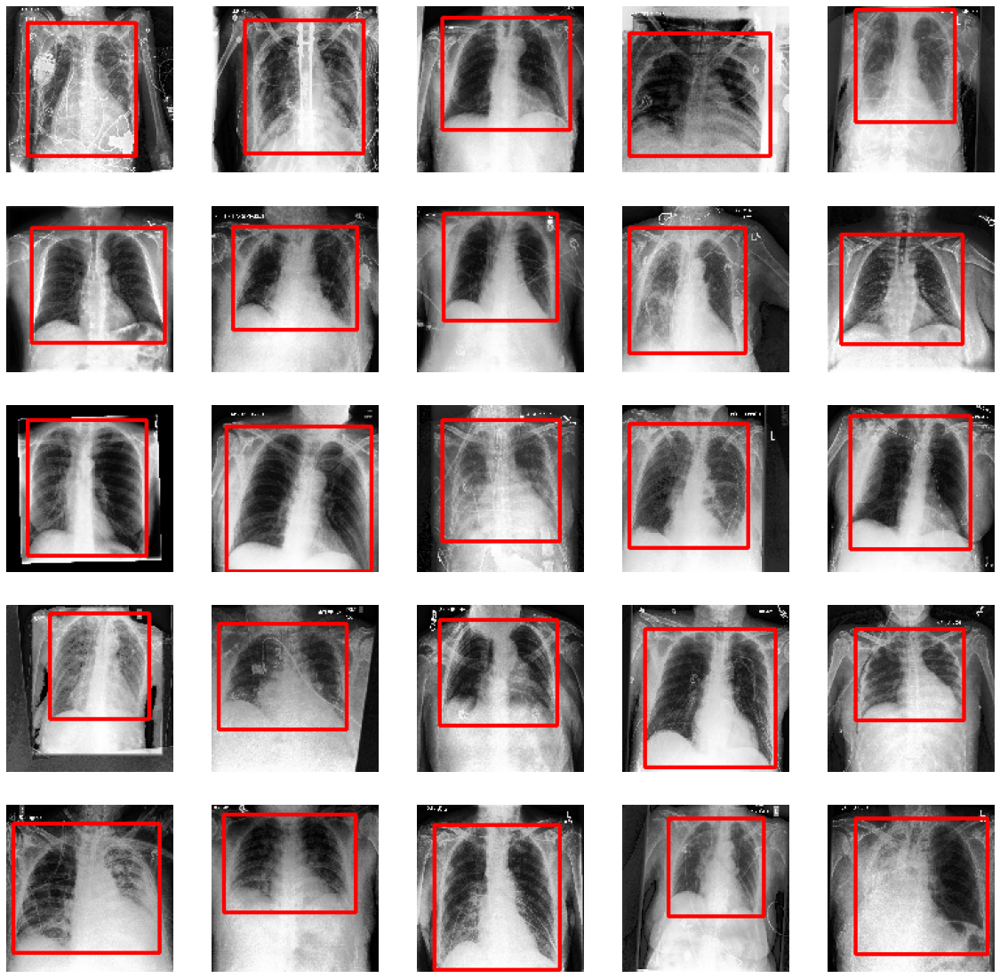

In [61]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
for i in range(0, 5):
  for j in range(0, 5):
    count = random.randrange(0, len(test_images))
    coordinates = model.predict(np.reshape(test_images[count], (1, 128, 128, 3)))[0]
    img = bbox_utils().draw_rectangle(image = test_images[count], list_coordinates = coordinates)
    axs[i, j].imshow(img)
    axs[i, j].axis('off')

## 9. Comparison of Methods
***

In [5]:
plot_df = pd.read_csv('/content/plot-data-chexpert.csv', delimiter = ',', 
                      usecols = ['Path', 'p1_x', 'p1_y', 'p2_x', 'p2_y'])

data_gen = tf.keras.preprocessing.image.ImageDataGenerator(rescale = 1./255.)

plot_generator = data_gen.flow_from_dataframe(dataframe = plot_df, directory = '', x_col = 'Path',
                                              y_col = ['p1_x', 'p1_y', 'p2_x', 'p2_y'], 
                                              target_size = (128, 128), color_mode = 'rgb', batch_size = 50,
                                              class_mode = 'raw', shuffle = False, seed = 42)

plot_x, plot_y = plot_generator[0]
plot_files = list(plot_df['Path'])

Found 50 validated image filenames.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

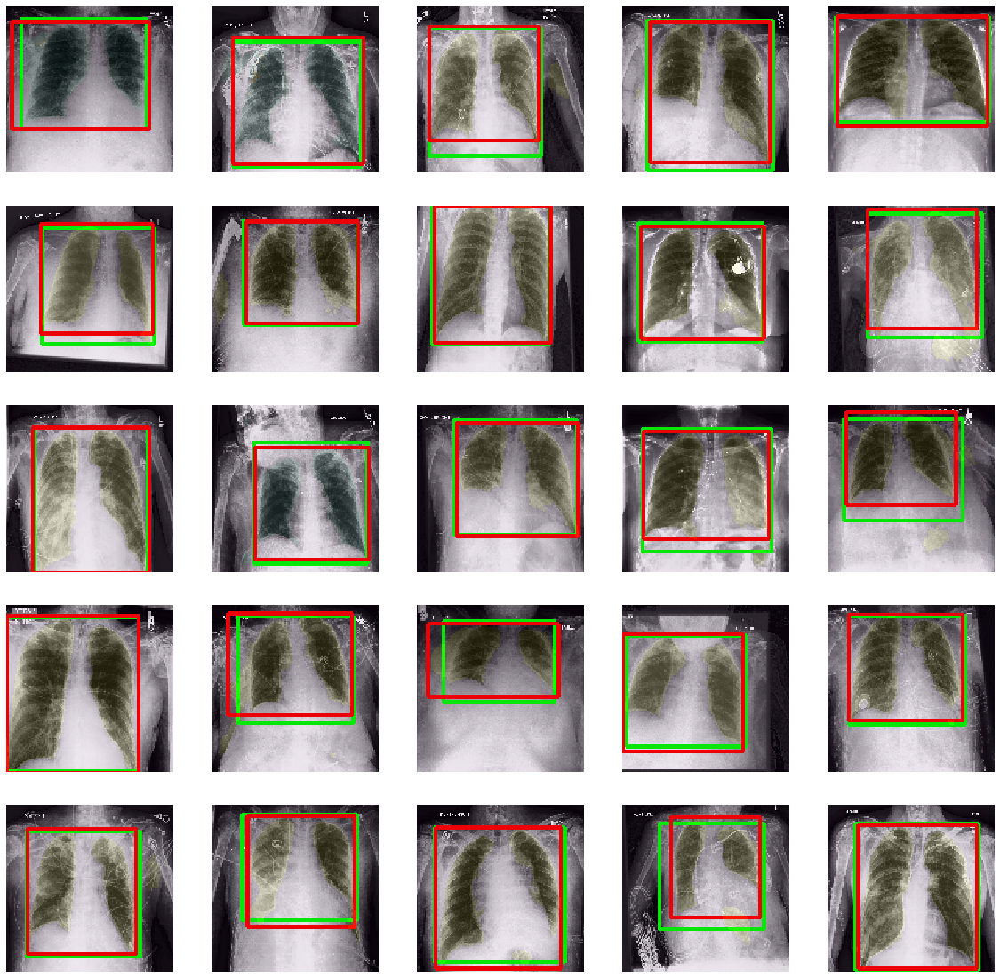

In [6]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
count = 0
for i in range(0, 5):
  for j in range(0, 5):
    img, mask = bbox_utils().make_segmentation(model = seg_model, path_image = plot_files[count])
    coordinates = model.predict(np.reshape(plot_x[count], (1, 128, 128, 3)))[0]
    img = bbox_utils().draw_rectangle(plot_x[count], coordinates, color = (0, 255, 0), thickness = 2)
    axs[i, j].imshow(img)
    axs[i, j].imshow(bbox_utils().draw_rectangle(image = img, list_coordinates = plot_y[count], 
                                                 color = (255, 0, 0), thickness = 2))
    mask = bbox_utils().resize_image(image = bbox_utils().join_masks(lung_left = mask[0], lung_right = mask[1]), 
                                     shape = (128, 128))
    axs[i, j].imshow(mask, alpha = 0.1)
    axs[i, j].axis('off')
    count += 1

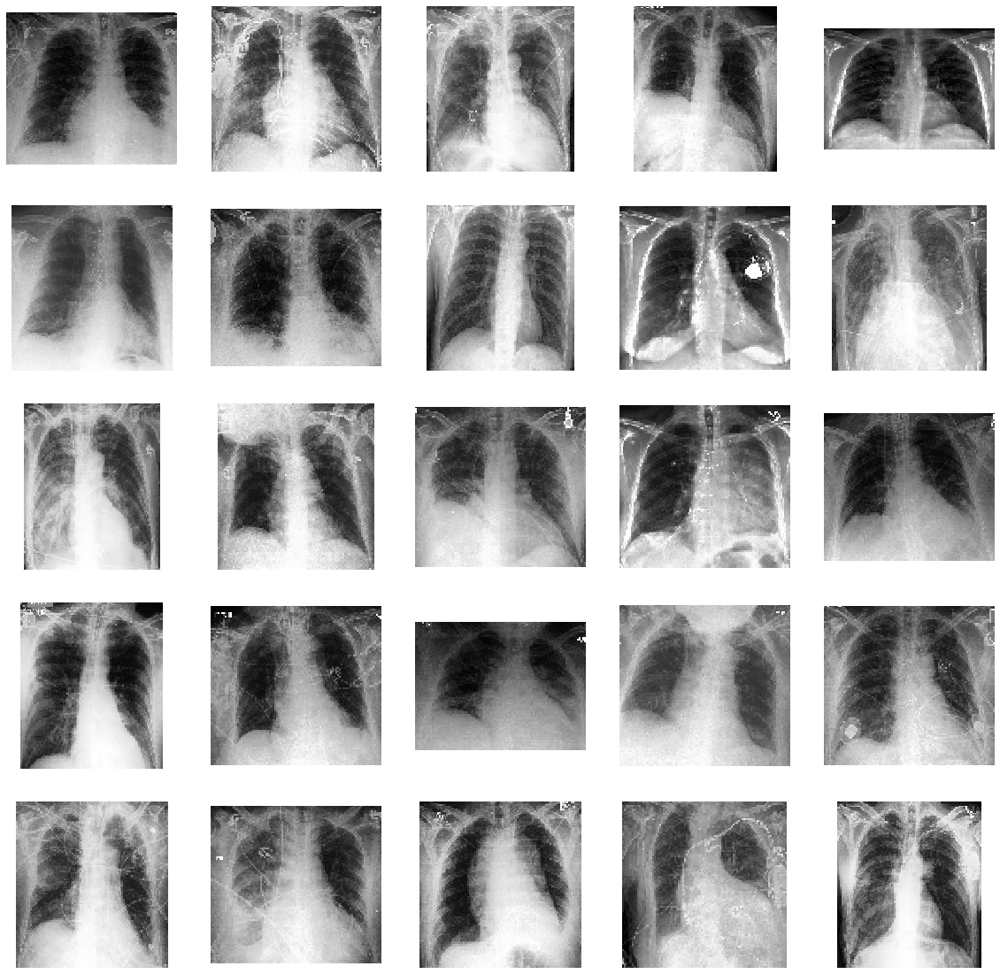

In [7]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
count = 0
for i in range(0, 5):
  for j in range(0, 5):
    coordinates = model.predict(np.reshape(plot_x[count], (1, 128, 128, 3)))[0]
    img = bbox_utils().crop_image(image = plot_x[count], list_coordinates = coordinates)
    axs[i, j].imshow(img)
    axs[i, j].axis('off')
    count += 1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

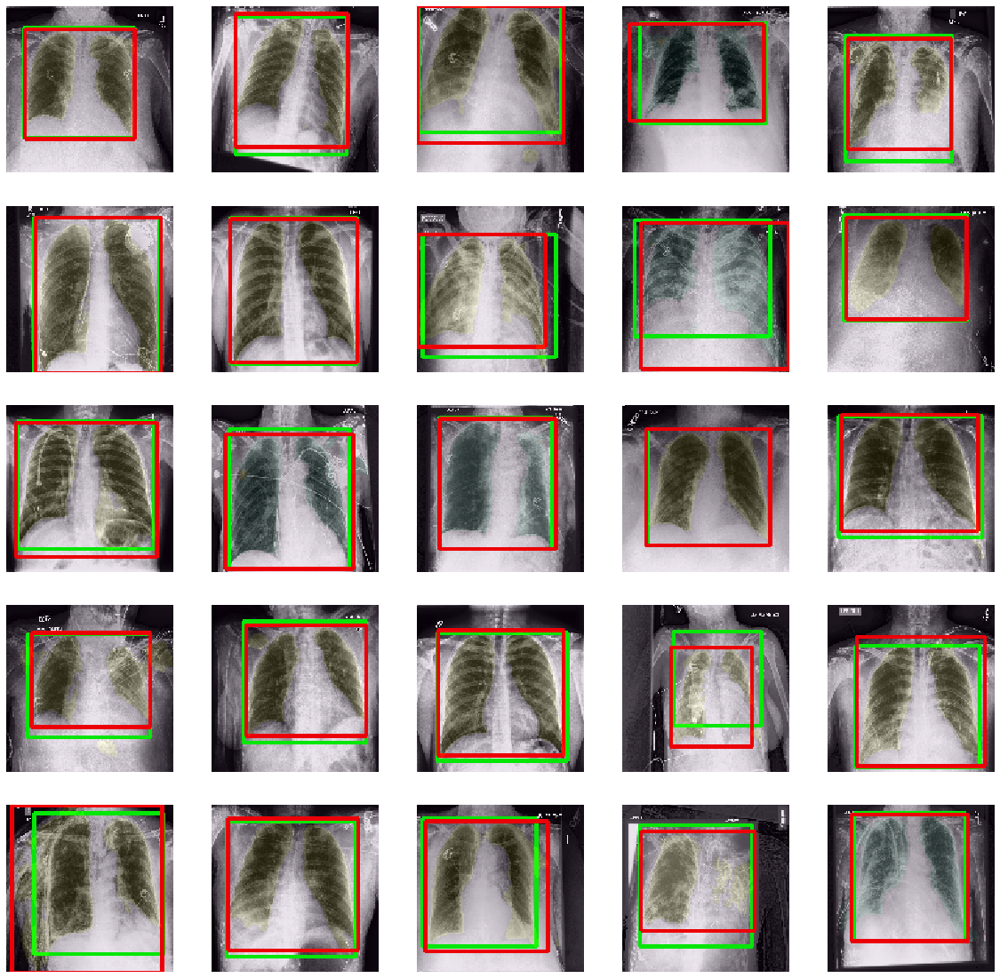

In [12]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
count = 25
for i in range(0, 5):
  for j in range(0, 5):
    img, mask = bbox_utils().make_segmentation(model = seg_model, path_image = plot_files[count])
    coordinates = model.predict(np.reshape(plot_x[count], (1, 128, 128, 3)))[0]
    img = bbox_utils().draw_rectangle(plot_x[count], coordinates, color = (0, 255, 0), thickness = 2)
    axs[i, j].imshow(img)
    axs[i, j].imshow(bbox_utils().draw_rectangle(image = img, list_coordinates = plot_y[count], 
                                                 color = (255, 0, 0), thickness = 2))
    mask = bbox_utils().resize_image(image = bbox_utils().join_masks(lung_left = mask[0], lung_right = mask[1]), 
                                     shape = (128, 128))
    axs[i, j].imshow(mask, alpha = 0.1)
    axs[i, j].axis('off')
    count += 1

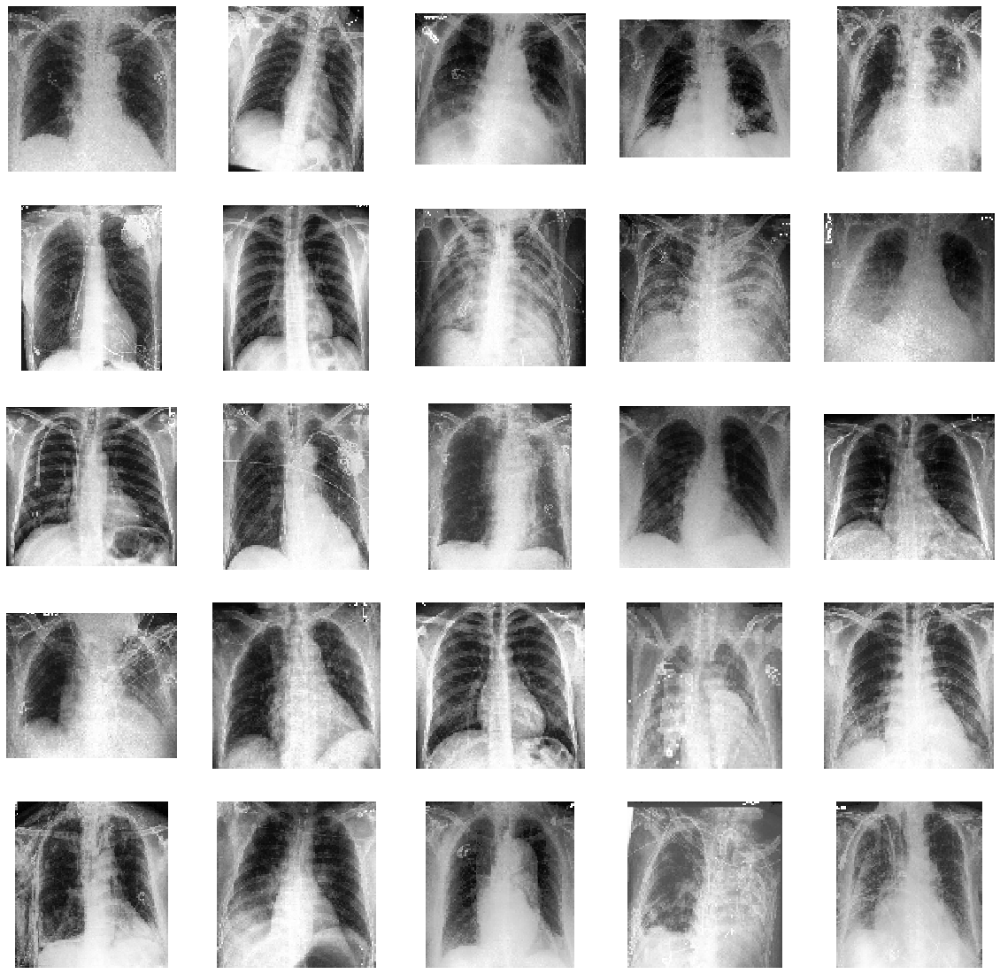

In [9]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
count = 25
for i in range(0, 5):
  for j in range(0, 5):
    coordinates = model.predict(np.reshape(plot_x[count], (1, 128, 128, 3)))[0]
    img = bbox_utils().crop_image(image = plot_x[count], list_coordinates = coordinates)
    axs[i, j].imshow(img)
    axs[i, j].axis('off')
    count += 1

## 10. Testing in another database
***

In [ ]:
!cp -r /content/gdrive/MyDrive/montglomery-shenzhen-datasets.zip /content/
!unzip /content/montglomery-shenzhen-datasets.zip
!rm /content/montglomery-shenzhen-datasets.zip

In [11]:
filelist_montgomery = glob.glob('/content/Montgomery/MontgomerySet/CXR_png/*.png')
filelist_shenzen = glob.glob('/content/ChinaSet_AllFiles/ChinaSet_AllFiles/CXR_png/*.png')

print('Number of Images from Montgomery Dataset:', len(filelist_montgomery), 'imagens')
print('Number of Images from Shenzhen Dataset:', len(filelist_shenzen), 'imagens')

montgomery_df = pd.DataFrame(filelist_montgomery, columns = ['Path'])
montgomery_df['Labels'] = np.zeros((len(filelist_montgomery, )))
shenzen_df = pd.DataFrame(filelist_shenzen, columns = ['Path'])
shenzen_df['Labels'] = np.zeros((len(filelist_shenzen, )))

Number of Images from Montgomery Dataset: 138 imagens
Number of Images from Shenzhen Dataset: 662 imagens


In [13]:
montgomery_generator = data_gen.flow_from_dataframe(dataframe = montgomery_df, directory = '', x_col = 'Path',
                                                    y_col = ['Labels'], target_size = (128, 128), 
                                                    color_mode = 'rgb', batch_size = 64, class_mode = 'raw', 
                                                    shuffle = False, seed = 42)

shenzen_generator = data_gen.flow_from_dataframe(dataframe = shenzen_df, directory = '', x_col = 'Path',
                                                 y_col = ['Labels'], target_size = (128, 128), 
                                                 color_mode = 'rgb', batch_size = 64, class_mode = 'raw', 
                                                 shuffle = False, seed = 42)

for i in range(0, len(montgomery_generator)):
  x, y = montgomery_generator[i]
  if i == 0:
    images_mont, labels_mont = x, y
  else:
    images_mont, labels_mont = np.concatenate((images_mont, x)), np.concatenate((labels_mont, y))

for i in range(0, len(shenzen_generator)):
  x, y = shenzen_generator[i]
  if i == 0:
    images_shen, labels_shen = x, y
  else:
    images_shen, labels_shen = np.concatenate((images_shen, x)), np.concatenate((labels_shen, y))

Found 138 validated image filenames.
Found 662 validated image filenames.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

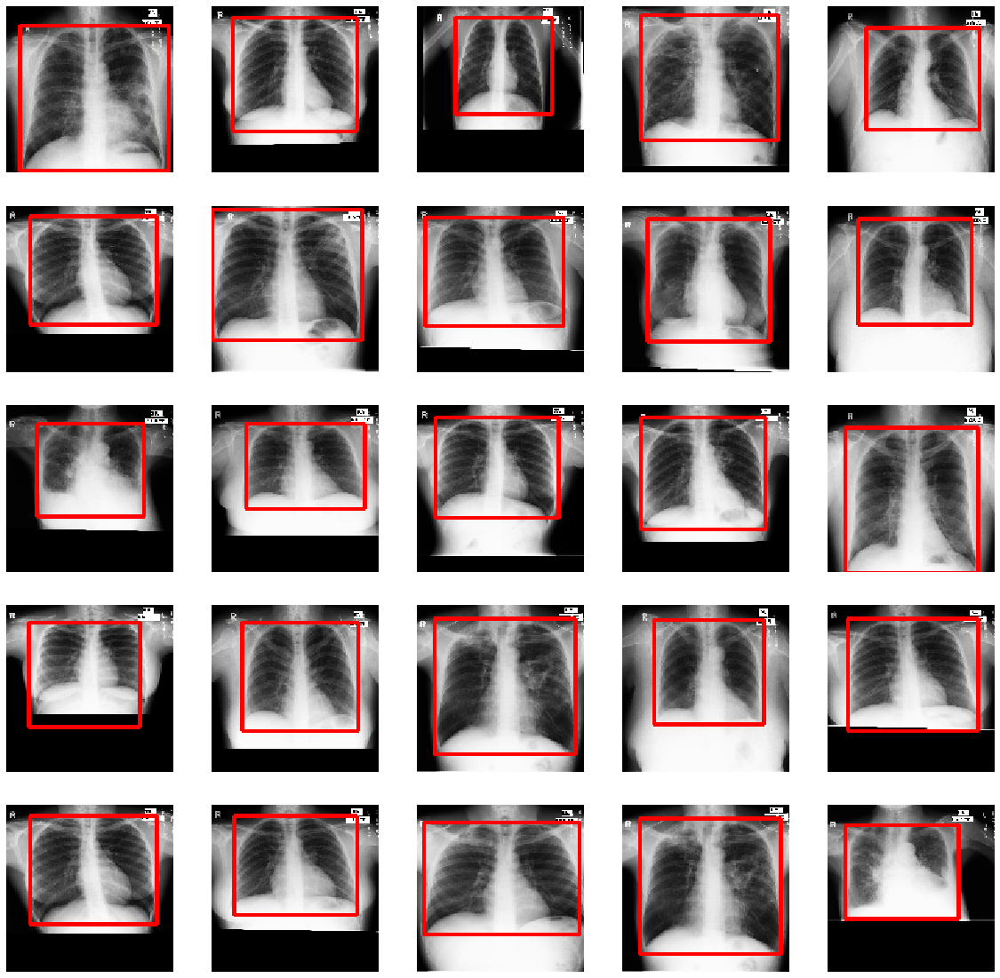

In [14]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
for i in range(0, 5):
  for j in range(0, 5):
    count = random.randrange(0, len(images_mont))
    coordinates = model.predict(np.reshape(images_mont[count], (1, 128, 128, 3)))[0]
    axs[i, j].imshow(bbox_utils().draw_rectangle(image = images_mont[count], list_coordinates = coordinates))
    axs[i, j].axis('off')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

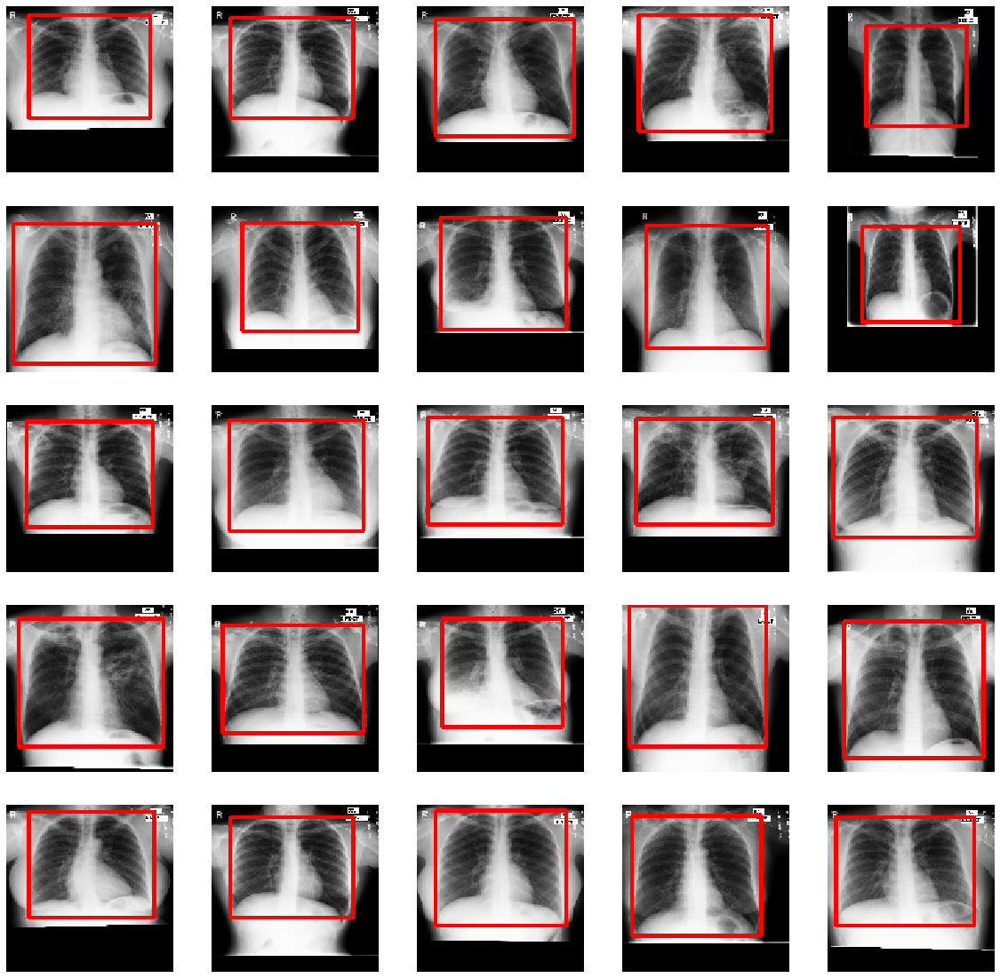

In [16]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
for i in range(0, 5):
  for j in range(0, 5):
    count = random.randrange(0, len(images_mont))
    coordinates = model.predict(np.reshape(images_mont[count], (1, 128, 128, 3)))[0]
    axs[i, j].imshow(bbox_utils().draw_rectangle(image = images_mont[count], list_coordinates = coordinates))
    axs[i, j].axis('off')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

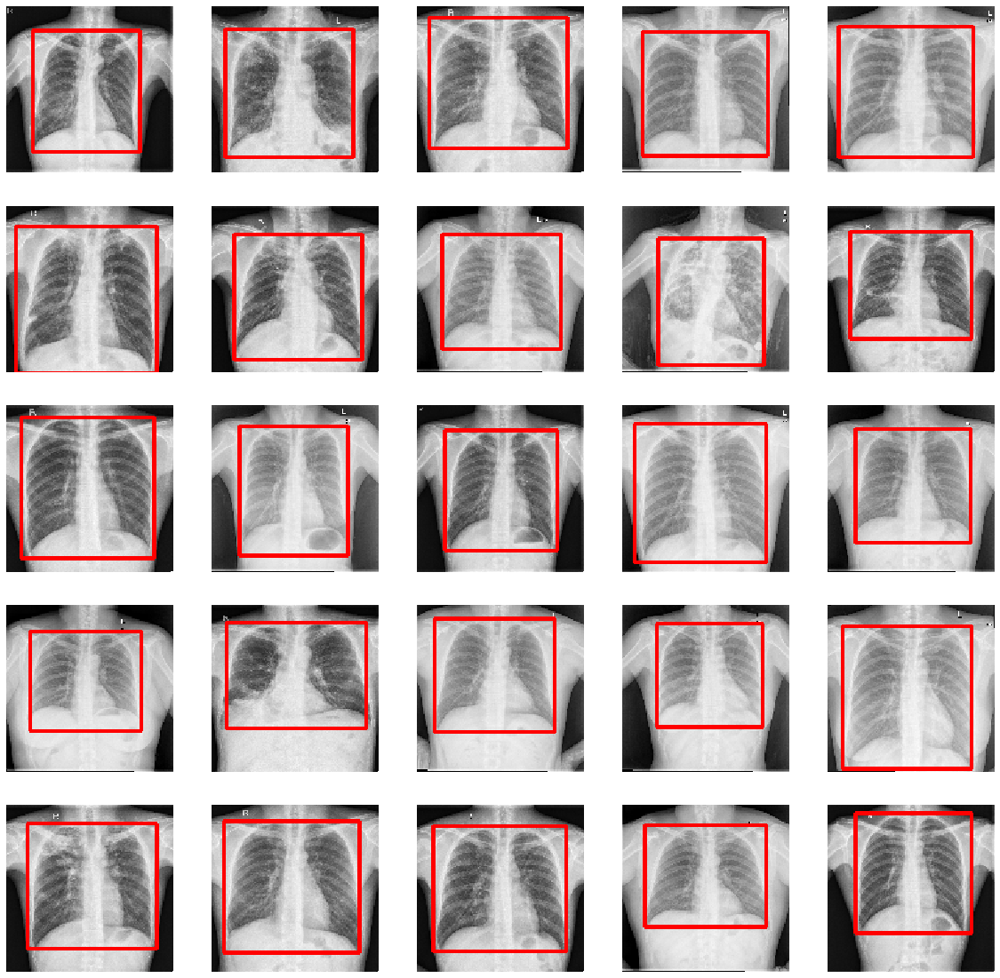

In [17]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
for i in range(0, 5):
  for j in range(0, 5):
    count = random.randrange(0, len(images_shen))
    coordinates = model.predict(np.reshape(images_shen[count], (1, 128, 128, 3)))[0]
    axs[i, j].imshow(bbox_utils().draw_rectangle(image = images_shen[count], list_coordinates = coordinates))
    axs[i, j].axis('off')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

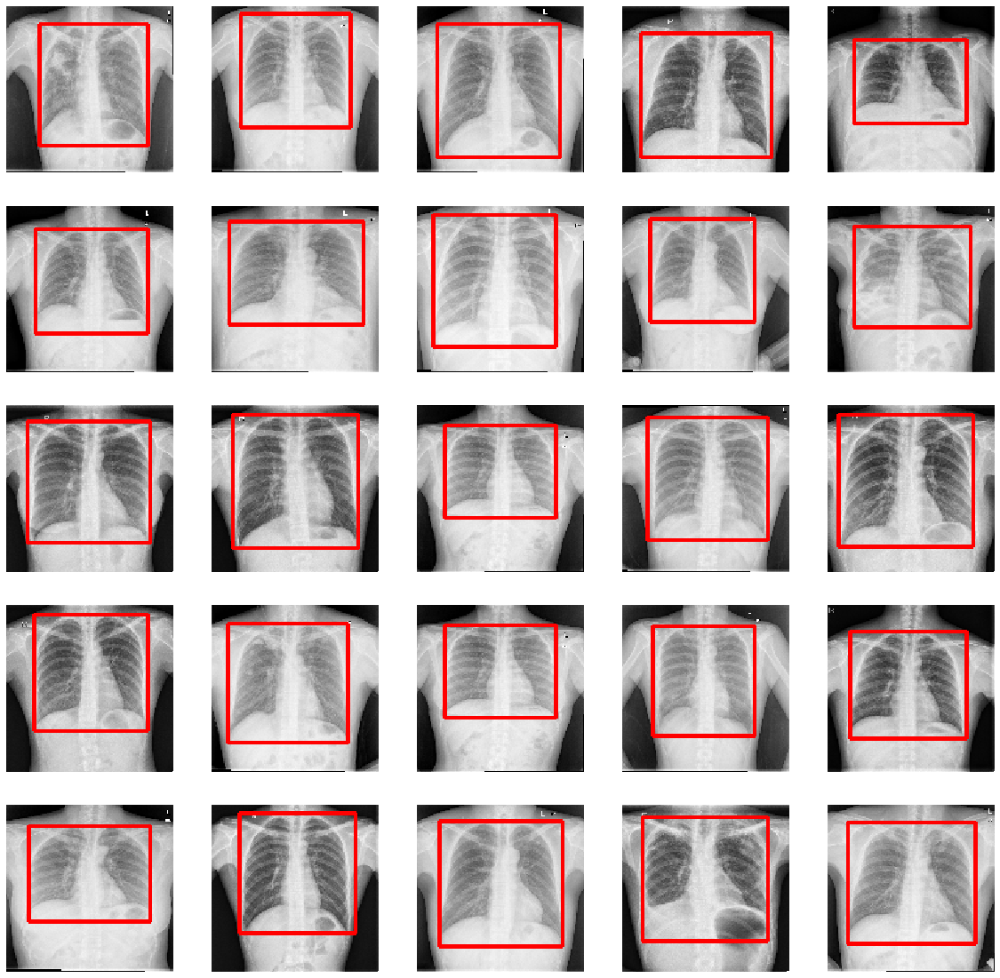

In [18]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
for i in range(0, 5):
  for j in range(0, 5):
    count = random.randrange(0, len(images_shen))
    coordinates = model.predict(np.reshape(images_shen[count], (1, 128, 128, 3)))[0]
    axs[i, j].imshow(bbox_utils().draw_rectangle(image = images_shen[count], list_coordinates = coordinates))
    axs[i, j].axis('off')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

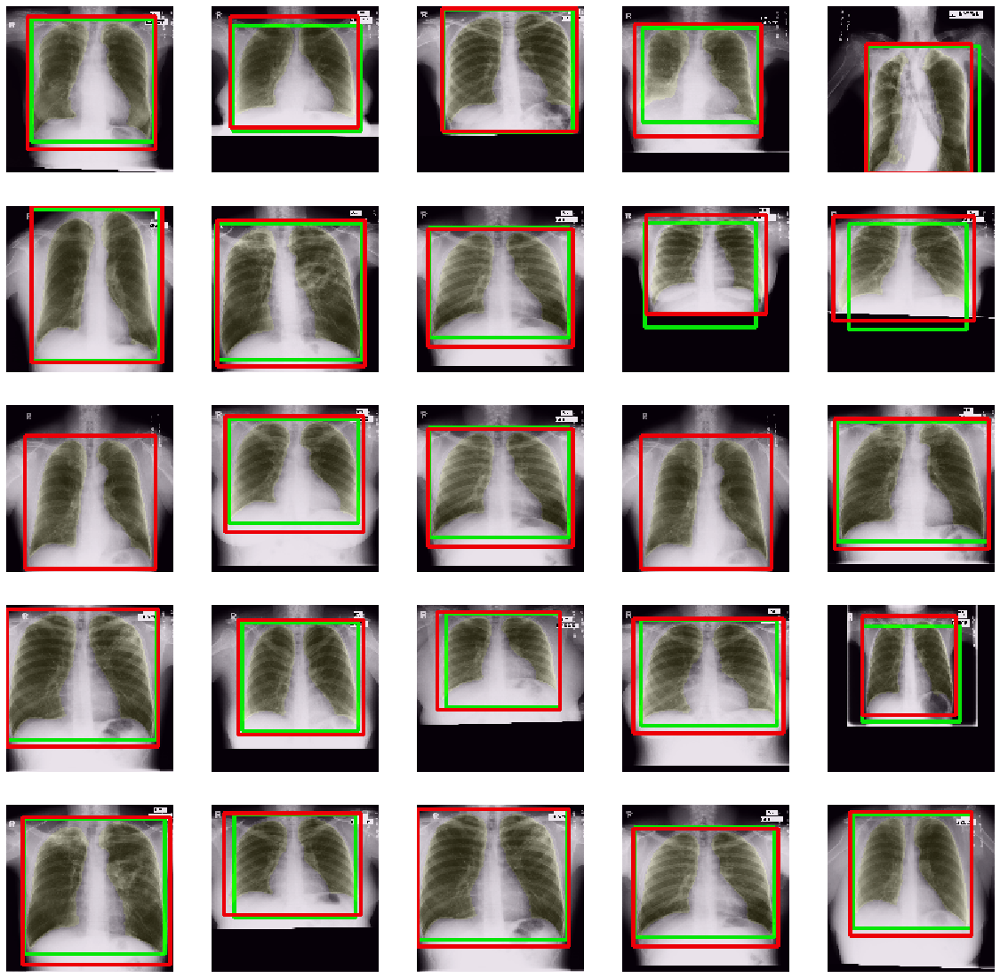

In [19]:
mem_count = list()
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
for i in range(0, 5):
  for j in range(0, 5):
    count = random.randrange(0, len(filelist_montgomery))
    img, mask = bbox_utils().make_segmentation(model = seg_model, path_image = filelist_montgomery[count])
    original_mask = bbox_utils().join_masks(lung_left = mask[0], lung_right = mask[1])
    contours = bbox_utils().get_contours(mask = original_mask.copy())
    mask_contours = bbox_utils().draw_contours(contours = bbox_utils().find_two_best_areas(contours = contours), 
                                               image_shape = img.shape)
    list_coordinates = bbox_utils().extract_coordinates(mask = mask_contours)
    coordinates = model.predict(np.reshape(images_mont[count], (1, 128, 128, 3)))[0]
    img = bbox_utils().draw_rectangle(images_mont[count], coordinates, color = (0, 255, 0), thickness = 2)
    axs[i, j].imshow(bbox_utils().draw_rectangle(image = img, list_coordinates = list_coordinates, 
                                                 color = (255, 0, 0), thickness = 2))
    original_mask = bbox_utils().resize_image(image = original_mask, shape = (128, 128))
    axs[i, j].imshow(original_mask, alpha = 0.1)
    axs[i, j].axis('off')
    mem_count.append(count)

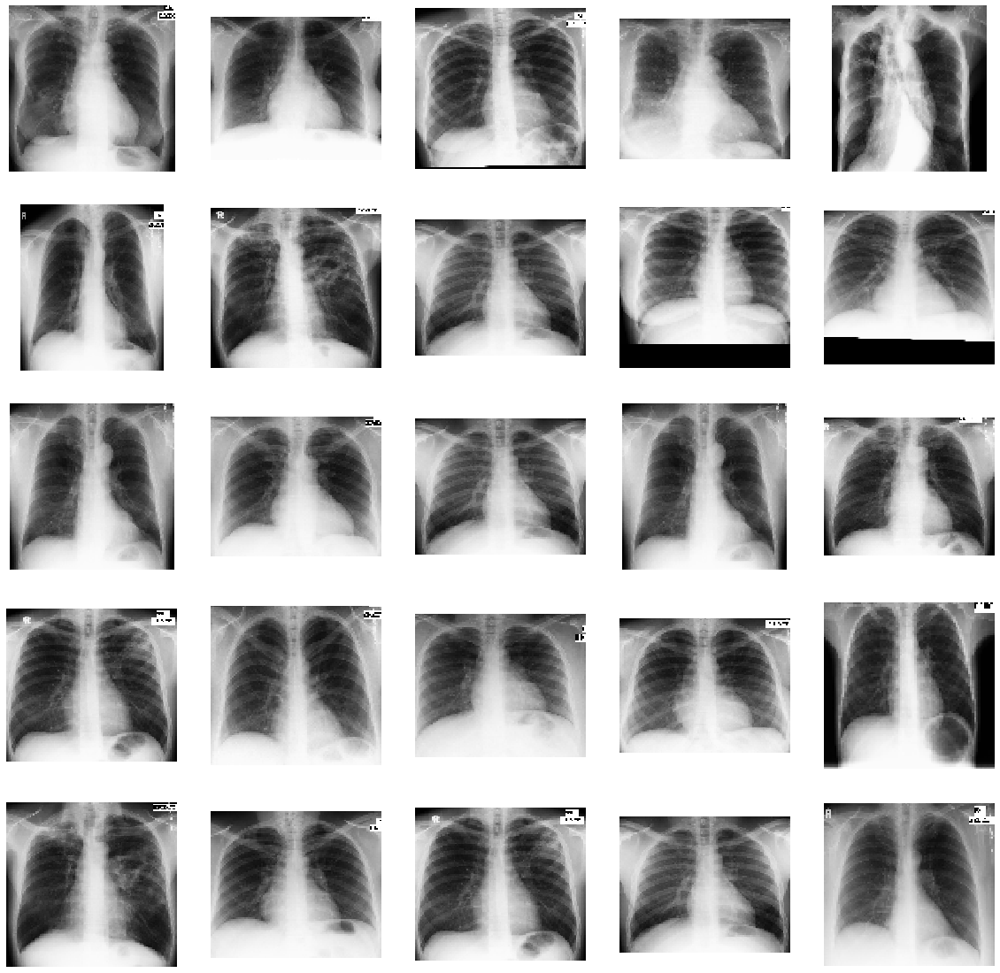

In [20]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
count = 0
for i in range(0, 5):
  for j in range(0, 5):
    coordinates = model.predict(np.reshape(images_mont[mem_count[count]], (1, 128, 128, 3)))[0]
    img = bbox_utils().crop_image(image = images_mont[mem_count[count]], list_coordinates = coordinates)
    axs[i, j].imshow(img)
    axs[i, j].axis('off')
    count += 1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

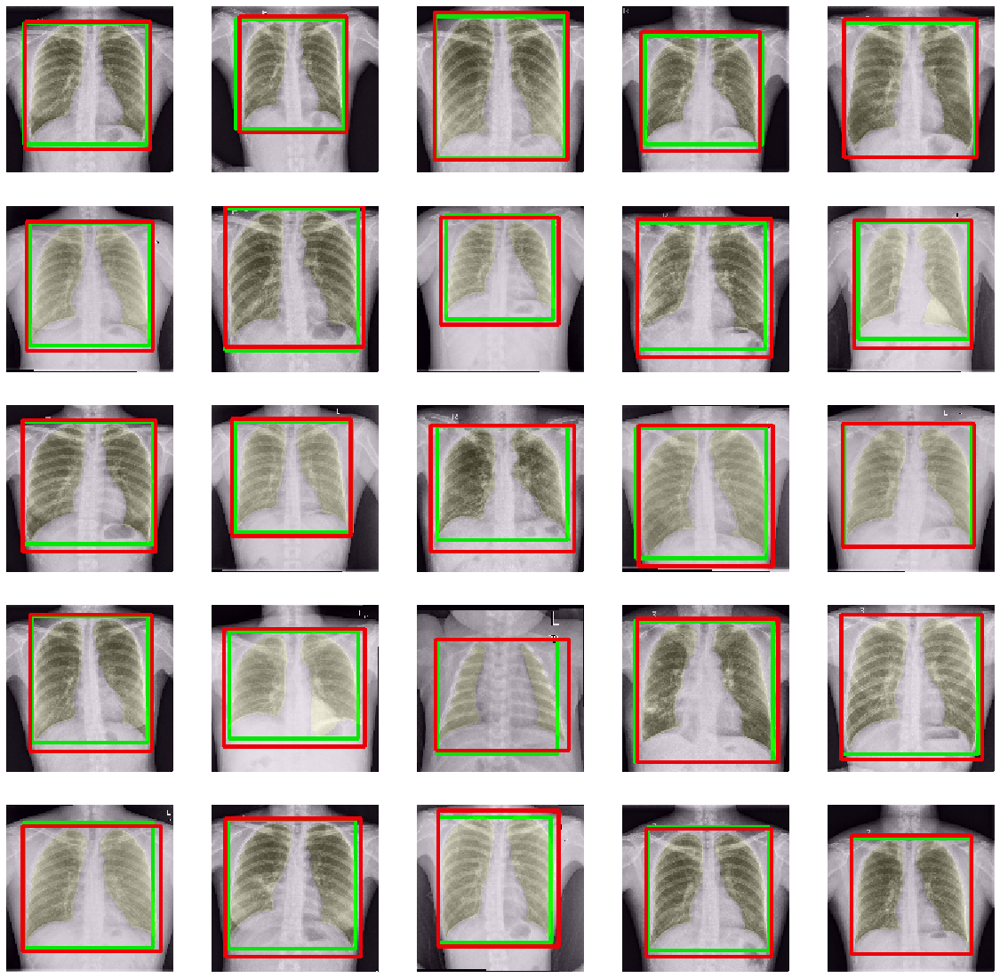

In [21]:
mem_count = list()
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
for i in range(0, 5):
  for j in range(0, 5):
    count = random.randrange(0, len(filelist_shenzen))
    img, mask = bbox_utils().make_segmentation(model = seg_model, path_image = filelist_shenzen[count])
    original_mask = bbox_utils().join_masks(lung_left = mask[0], lung_right = mask[1])
    contours = bbox_utils().get_contours(mask = original_mask.copy())
    mask_contours = bbox_utils().draw_contours(contours = bbox_utils().find_two_best_areas(contours = contours), 
                                               image_shape = img.shape)
    list_coordinates = bbox_utils().extract_coordinates(mask = mask_contours)
    coordinates = model.predict(np.reshape(images_shen[count], (1, 128, 128, 3)))[0]
    img = bbox_utils().draw_rectangle(images_shen[count], coordinates, color = (0, 255, 0), thickness = 2)
    axs[i, j].imshow(bbox_utils().draw_rectangle(image = img, list_coordinates = list_coordinates, 
                                                 color = (255, 0, 0), thickness = 2))
    original_mask = bbox_utils().resize_image(image = original_mask, shape = (128, 128))
    axs[i, j].imshow(original_mask, alpha = 0.1)
    axs[i, j].axis('off')
    mem_count.append(count)

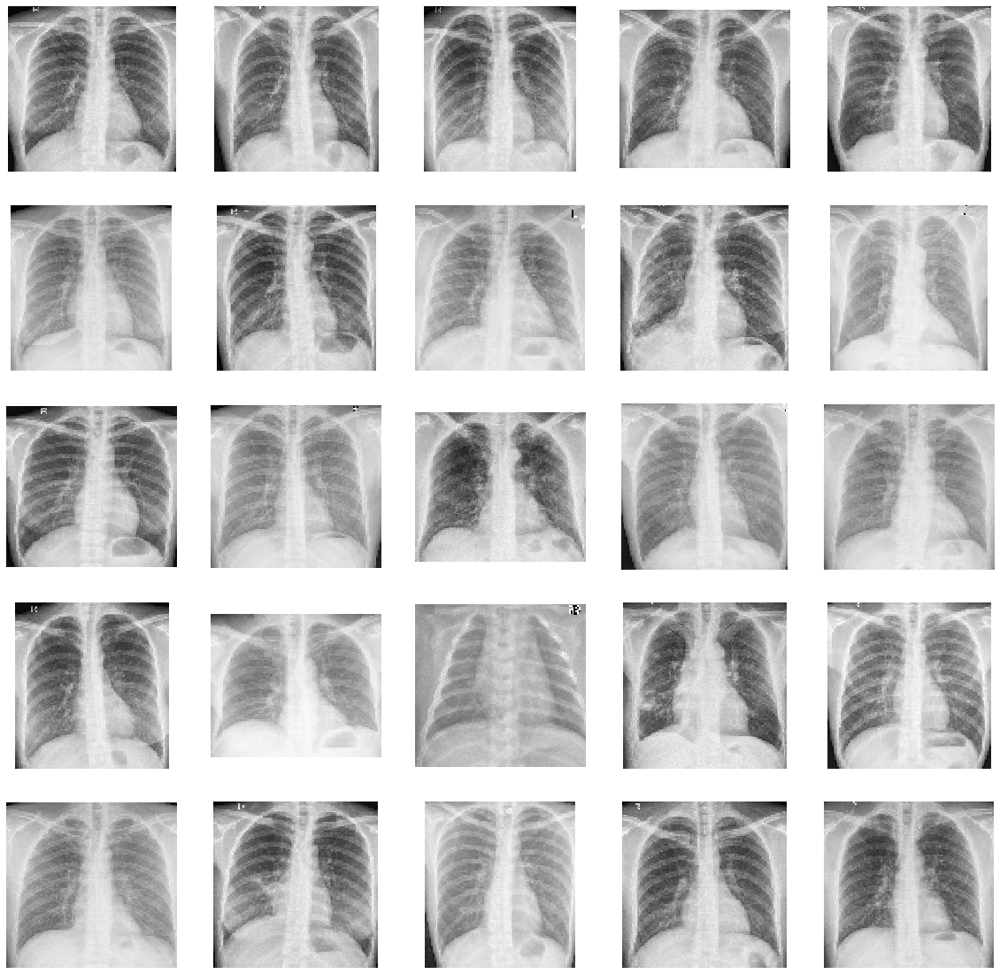

In [22]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
count = 0
for i in range(0, 5):
  for j in range(0, 5):
    coordinates = model.predict(np.reshape(images_shen[mem_count[count]], (1, 128, 128, 3)))[0]
    img = bbox_utils().crop_image(image = images_shen[mem_count[count]], list_coordinates = coordinates)
    axs[i, j].imshow(img)
    axs[i, j].axis('off')
    count += 1

## 11. Comparação de Tempo de Inferência
***

In [23]:
start_time = time.time()
coordinates_list = list()
for image in plot_files:
  img, mask = bbox_utils().make_segmentation(model = seg_model, path_image = image)
  original_mask = bbox_utils().join_masks(lung_left = mask[0], lung_right = mask[1])
  list_coordinates = bbox_utils().extract_coordinates(mask = original_mask)
  coordinates_list.append(list_coordinates)
end_time = time.time()

print('Pulmonary Segmentation')
print('Runtime: {:.3f} milliseconds'.format(((end_time - start_time) / 50) * 1000))

Pulmonary Segmentation
Runtime: 29.457 milliseconds


In [24]:
start_time = time.time()
coordinates_list = list()
for image in plot_files:
  img, mask = bbox_utils().make_segmentation(model = seg_model, path_image = image)
  original_mask = bbox_utils().join_masks(lung_left = mask[0], lung_right = mask[1])
  contours = bbox_utils().get_contours(mask = original_mask.copy())
  mask_contours = bbox_utils().draw_contours(contours = bbox_utils().find_two_best_areas(contours =contours), 
                                             image_shape = img.shape)
  list_coordinates = bbox_utils().extract_coordinates(mask = mask_contours)
  coordinates_list.append(list_coordinates)

end_time = time.time()

print('Pulmonary Segmentation + Image Processing')
print('Runtime: {:.3f} milliseconds'.format(((end_time - start_time) / 50) * 1000))

Pulmonary Segmentation + Image Processing
Runtime: 48.832 milliseconds


In [25]:
start_time = time.time()
for image in plot_files:
  coordinates_list  = model.predict(plot_x)
end_time = time.time()

print('Convolutional Neural Networks')
print('Runtime: {:.3f} milliseconds'.format(((end_time - start_time) / 50) * 1000))

Convolutional Neural Networks
Runtime: 1.620 milliseconds


|**Method**|**Inference Time (milliseconds)**|
|:-|:-:|
|Pulmonary Segmentation|29.457|
|Pulmonary Segmentation + Image Processing|48.832|
|Convolutional Neural Networks|1.620|